In [1]:
import numpy as np  #library for matrix-array analysis
import pandas as pd  #library for advanced data analysis
import matplotlib.pyplot as plt #library to plot graphs
import pickle #library to handle input/output
import seaborn as sns #seaborn wrapper plotting library
from sklearn.preprocessing import StandardScaler #import the module to perform standardization
from sklearn.decomposition import PCA #import the module to perform Principal Component Analysis
from sklearn.model_selection import train_test_split #import package to create the train and test dataset
from sklearn.linear_model import LogisticRegression #import package to perform Logistic Regression
from sklearn.ensemble import RandomForestClassifier #import package to perform Random Forest
from sklearn.ensemble import GradientBoostingClassifier #import package to perform Gradient Boosting
from sklearn.neighbors import KNeighborsClassifier #import package to perform k-NN classifier
from sklearn.metrics import precision_score, recall_score, f1_score #import metrics score to validate algorithms
import sys
from sklearn.metrics import confusion_matrix as CM #import the confusion matrix package to evaluate classification performance
from sklearn.model_selection import cross_val_score #import cross-validation module
from sklearn.model_selection import learning_curve #import learning curve module
from sklearn.metrics import precision_recall_curve #import precision-recall curve
import bisect #import module to provide support for maintaining a list in sorted order without having to sort the list after each insertion
from scipy.stats import mstats #import module to evaluate some statistical objects

In [2]:
input_path = './'
onput_path = input_path
input_df = pd.read_csv(input_path + 'dataset1.csv')
input_df.describe()

,1c1,2c1,3c1,4c1,5c1,6c1,7c1,8c1,9c1,10c1,...,1458c4,1459c4,1460c4,1461c4,1462c4,1463c4,1464c4,1465c4,1466c4,1467c4
count,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,...,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000,134.000000
mean,9.897537,10.172567,10.251701,10.786134,9.974604,10.002619,10.469246,10.190433,10.065440,9.737940,...,8.286714,7.479241,7.820552,9.774500,8.776448,7.903851,8.805500,9.758361,10.576361,8.977612
std,1.319701,0.624640,0.330176,0.436394,0.447472,0.360904,0.742989,0.599430,0.297255,0.372525,...,1.904402,1.863048,2.195594,2.921805,1.858145,1.338878,2.516733,2.274740,2.629836,4.842244
min,6.175000,7.983000,9.543000,9.751000,8.714000,9.077000,8.097000,8.571000,9.348000,8.909000,...,1.796000,1.226000,1.255000,0.118000,4.903000,2.157000,2.824000,1.883000,3.570000,0.706000
25%,9.135000,9.803750,10.010250,10.456000,9.691000,9.742750,10.125000,9.869750,9.880500,9.431750,...,7.135250,6.945833,7.061000,8.669000,7.924000,7.610000,8.247750,9.336000,9.336000,6.907000
50%,9.921500,10.296000,10.310000,10.786500,9.968000,10.005000,10.577000,10.174000,10.072000,9.770000,...,8.188500,7.414000,7.375000,9.963500,8.649500,7.924000,8.591000,9.846000,10.277000,8.503500
75%,10.807250,10.548000,10.455000,11.102250,10.189000,10.236750,10.915750,10.589500,10.295000,10.010500,...,9.023500,7.877000,8.306250,11.042250,9.522250,8.198000,8.855250,10.356000,11.336000,9.777000
max,12.624000,11.869000,11.127000,12.065000,11.399000,10.703000,12.316000,11.666000,10.868000,10.594000,...,18.685000,16.935000,18.162000,19.966000,18.123000,15.573000,31.028000,18.750000,20.006000,32.902000


<Figure size 1152x1152 with 0 Axes>

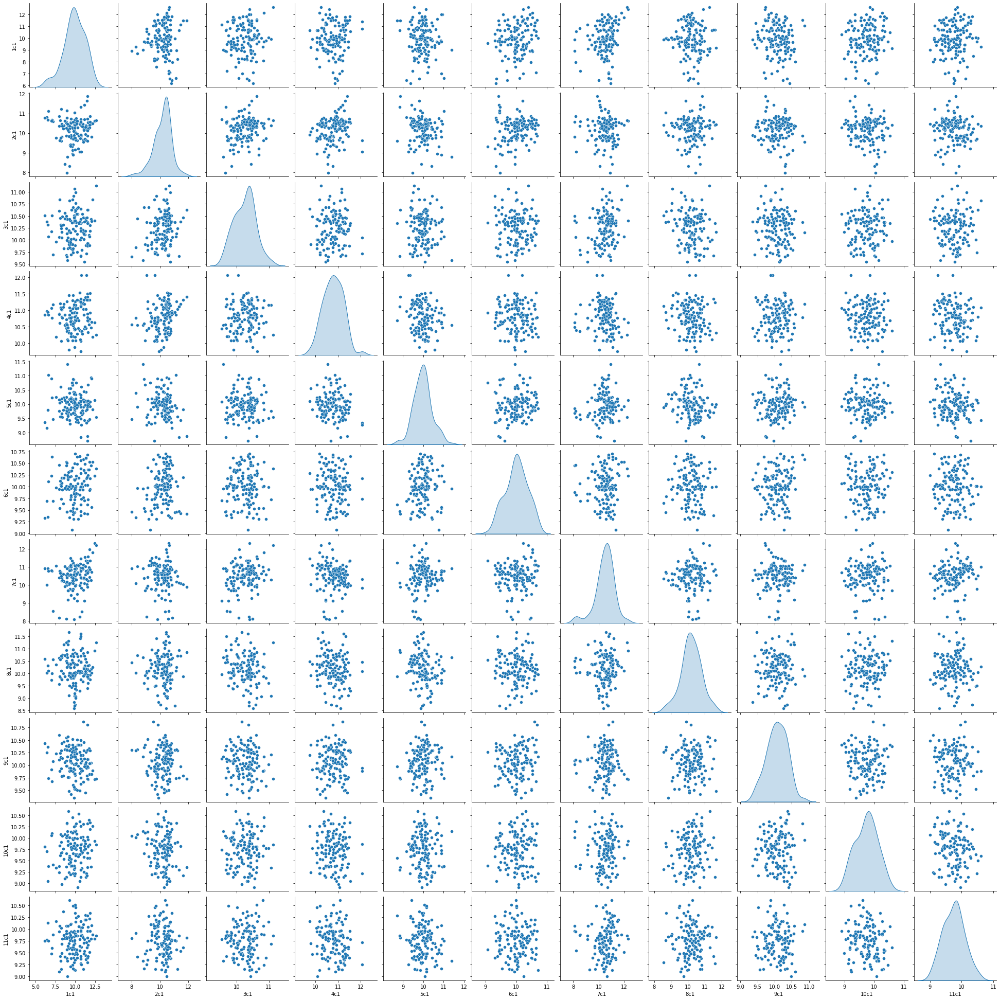

<Figure size 1152x1152 with 0 Axes>

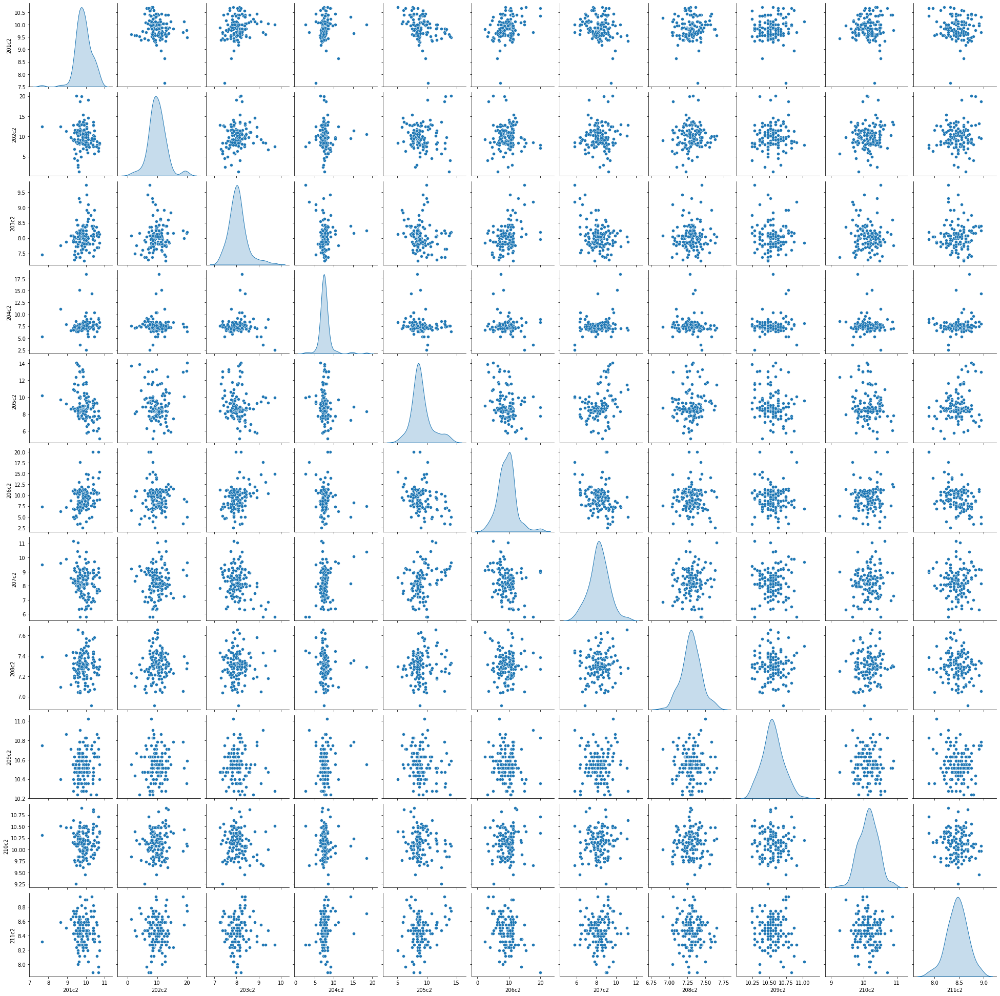

<Figure size 1152x1152 with 0 Axes>

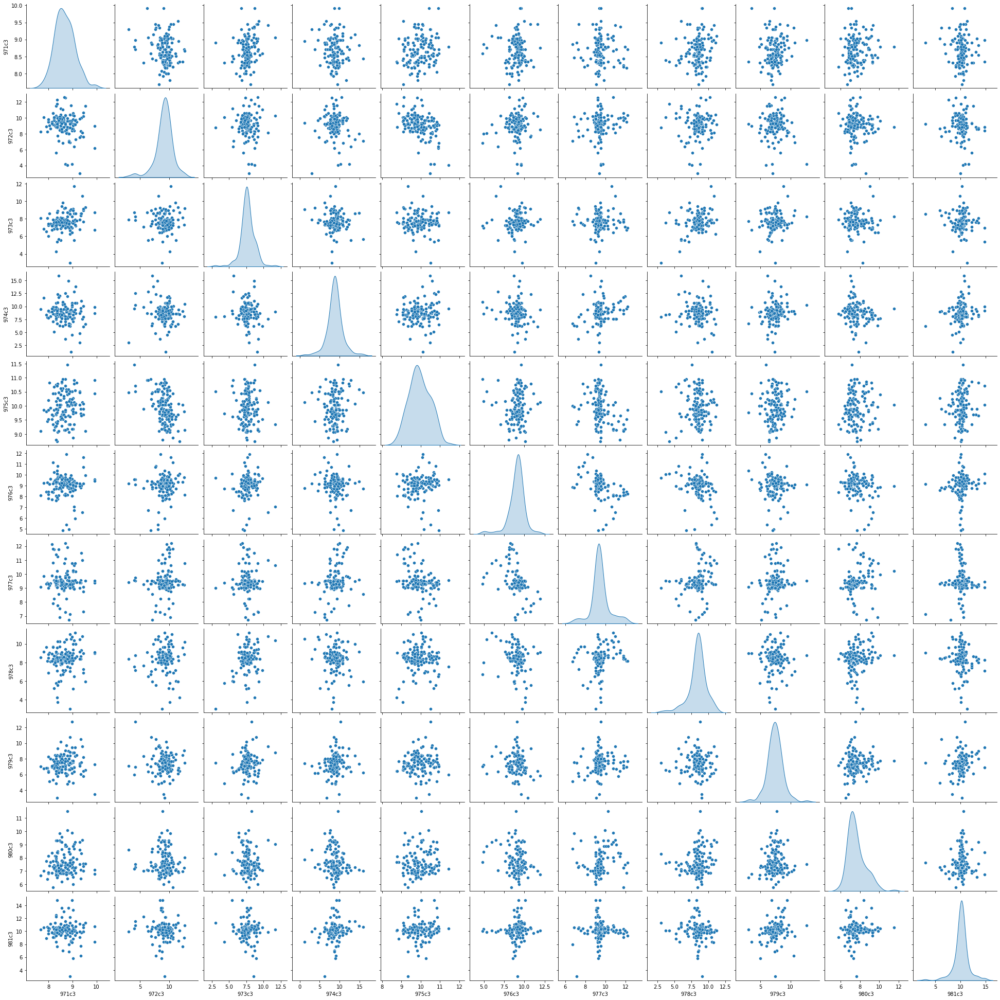

<Figure size 1152x1152 with 0 Axes>

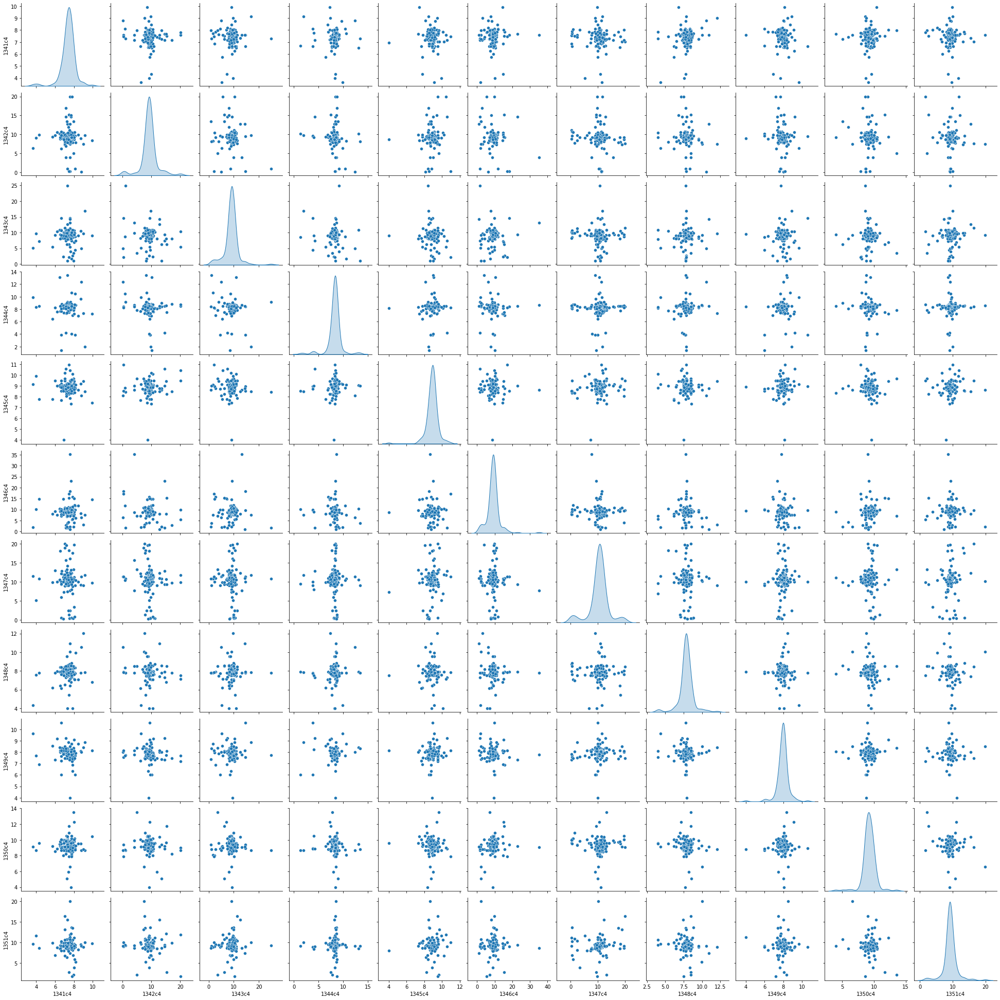

<Figure size 1152x1152 with 0 Axes>

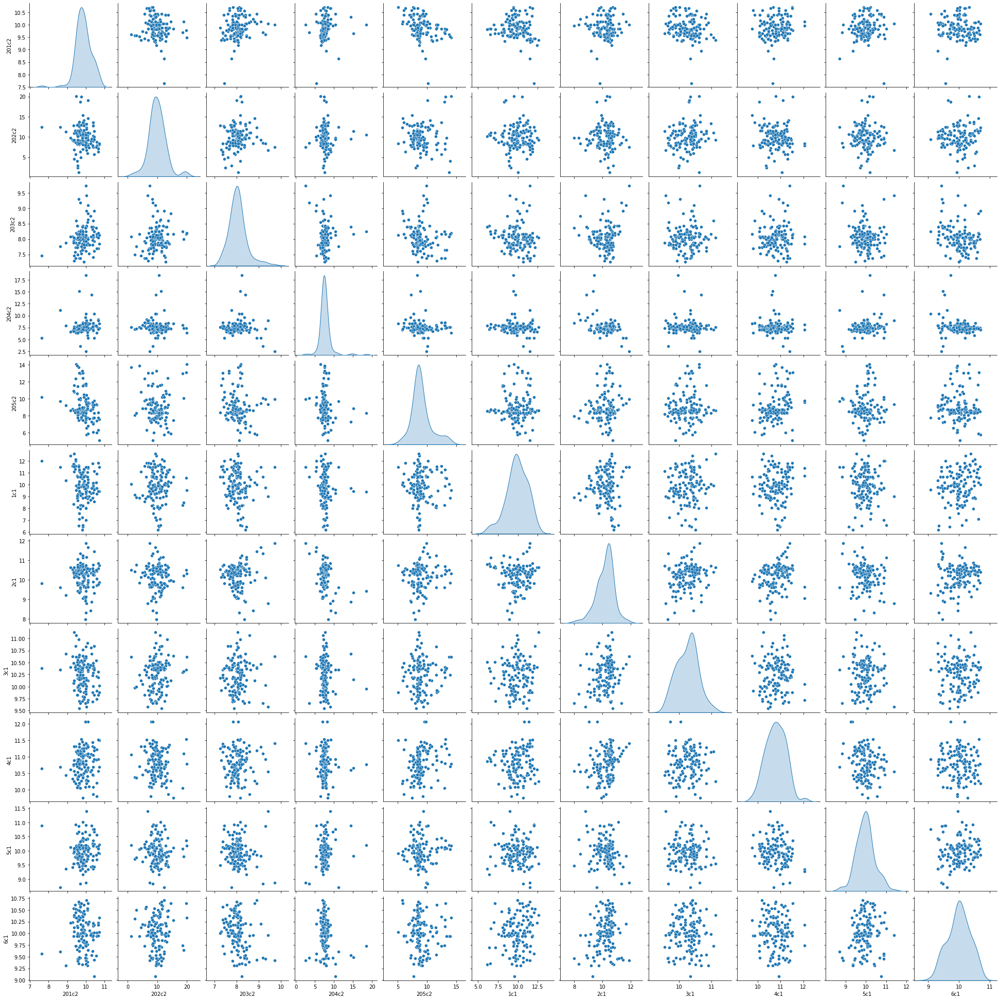

<Figure size 1152x1152 with 0 Axes>

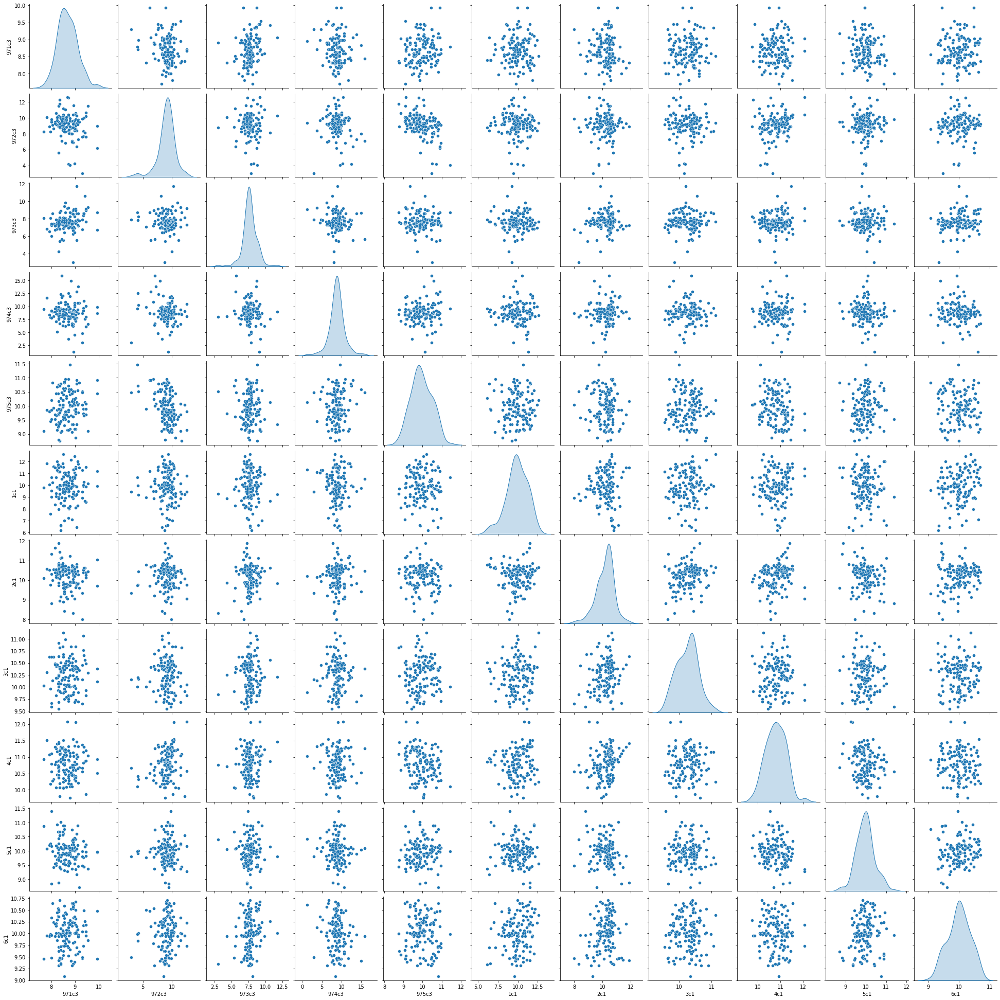

<Figure size 1152x1152 with 0 Axes>

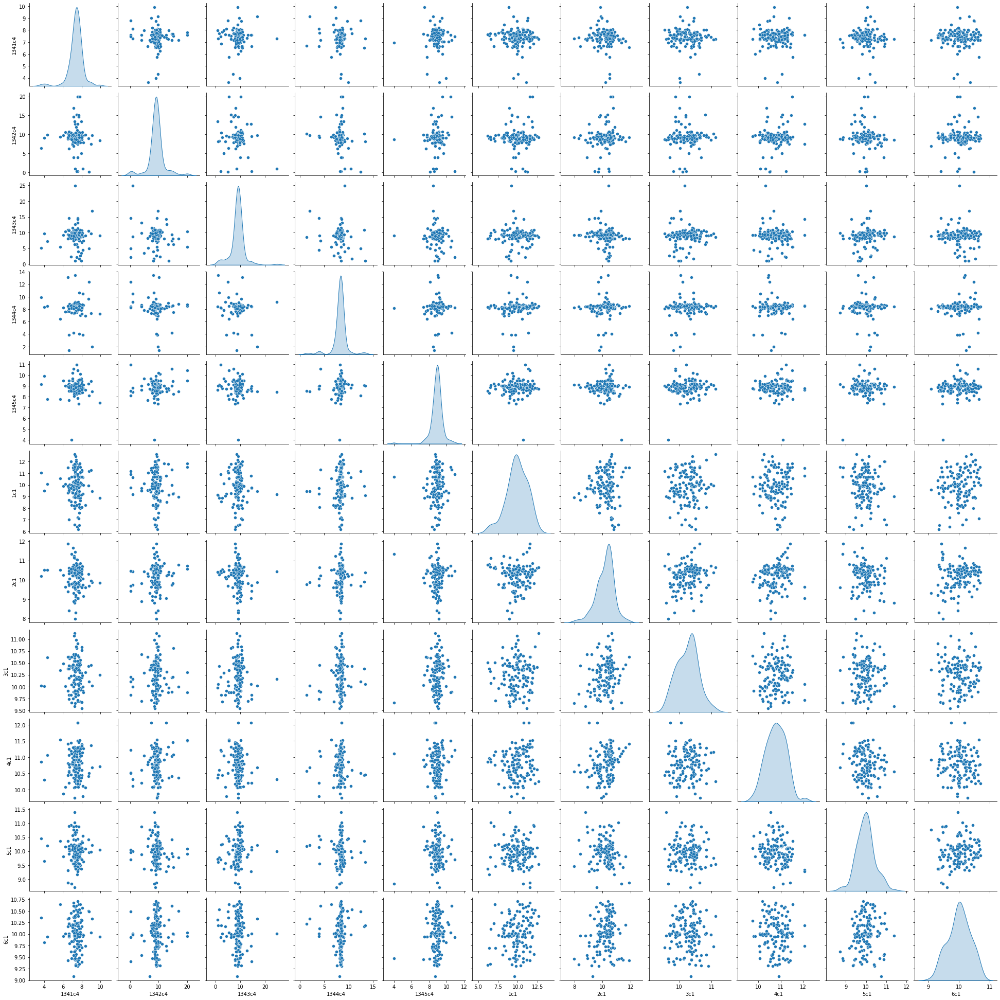

In [5]:
input_filled_df = input_df.fillna(input_df.mean())

fig1 = plt.figure(figsize=(16,16));
sns.pairplot(input_filled_df.iloc[:,np.hstack((range(0,11)))],diag_kind = 'kde', palette='Set1');
fig2 = plt.figure(figsize=(16,16));
sns.pairplot(input_filled_df.iloc[:,np.hstack((range(200,211)))],diag_kind='kde',palette='Set1');
fig3 = plt.figure(figsize=(16,16));
sns.pairplot(input_filled_df.iloc[:,np.hstack((range(970,981)))],diag_kind='kde',palette='Set1');
fig4 = plt.figure(figsize=(16,16));
sns.pairplot(input_filled_df.iloc[:,np.hstack((range(1340,1351)))],diag_kind='kde',palette='Set1');
fig5 = plt.figure(figsize=(16,16));
sns.pairplot(input_filled_df.iloc[:,np.hstack((range(200,205), range(0,6)))],diag_kind='kde',palette='Set1');
fig6 = plt.figure(figsize=(16,16));
sns.pairplot(input_filled_df.iloc[:,np.hstack((range(970,975), range(0,6)))],diag_kind='kde',palette='Set1');
fig7 = plt.figure(figsize=(16,16));
sns.pairplot(input_filled_df.iloc[:,np.hstack((range(1340,1345), range(0,6)))],diag_kind='kde',palette='Set1');

In [3]:
input_df = pd.read_csv(input_path + 'dataset2.csv')
input_df.describe()

,1c4,2c4,3c4,4c4,5c4,6c4,7c4,8c4,9c4,10c4,...,491c5,492c5,493c5,494c5,495c5,496c5,497c5,498c5,499c5,500c5
count,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,...,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000,376.000000
mean,0.000840,0.000330,-0.000747,0.001598,0.000226,-0.001202,0.000548,-0.001516,-0.002181,-0.000069,...,-0.000032,-0.000223,-0.000468,0.000726,-0.003346,-0.002423,0.013476,0.002492,0.001162,-0.000904
std,0.362628,0.269451,0.171349,0.397166,0.741507,0.201400,0.249615,0.364248,0.300058,0.184999,...,0.393807,0.815254,0.474493,0.576396,0.832248,1.836472,1.377797,0.319442,0.232724,0.384541
min,-1.567000,-0.978000,-0.771000,-1.649000,-3.577000,-0.836000,-1.093000,-1.349000,-0.922000,-0.561000,...,-1.995000,-4.824000,-3.211000,-2.170000,-4.251000,-5.092000,-9.231000,-1.223000,-1.330000,-1.867000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.010500,0.000000,-0.051000,0.000000,...,0.000000,-0.151750,-0.140750,-0.078750,0.000000,-0.711750,0.000000,-0.133250,0.000000,-0.094500
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.008250,0.002250,0.000000,0.000000,0.000000,0.000000,0.016250,0.000000,...,0.000000,0.084250,0.077250,0.000000,0.000000,0.566000,0.138250,0.142250,0.000000,0.109750
max,2.637000,1.012000,0.604000,2.884000,7.605000,0.968000,1.246000,1.619000,1.523000,1.092000,...,1.615000,6.724000,2.975000,2.737000,8.147000,16.763000,4.888000,1.304000,1.007000,1.882000


<Figure size 1152x1152 with 0 Axes>

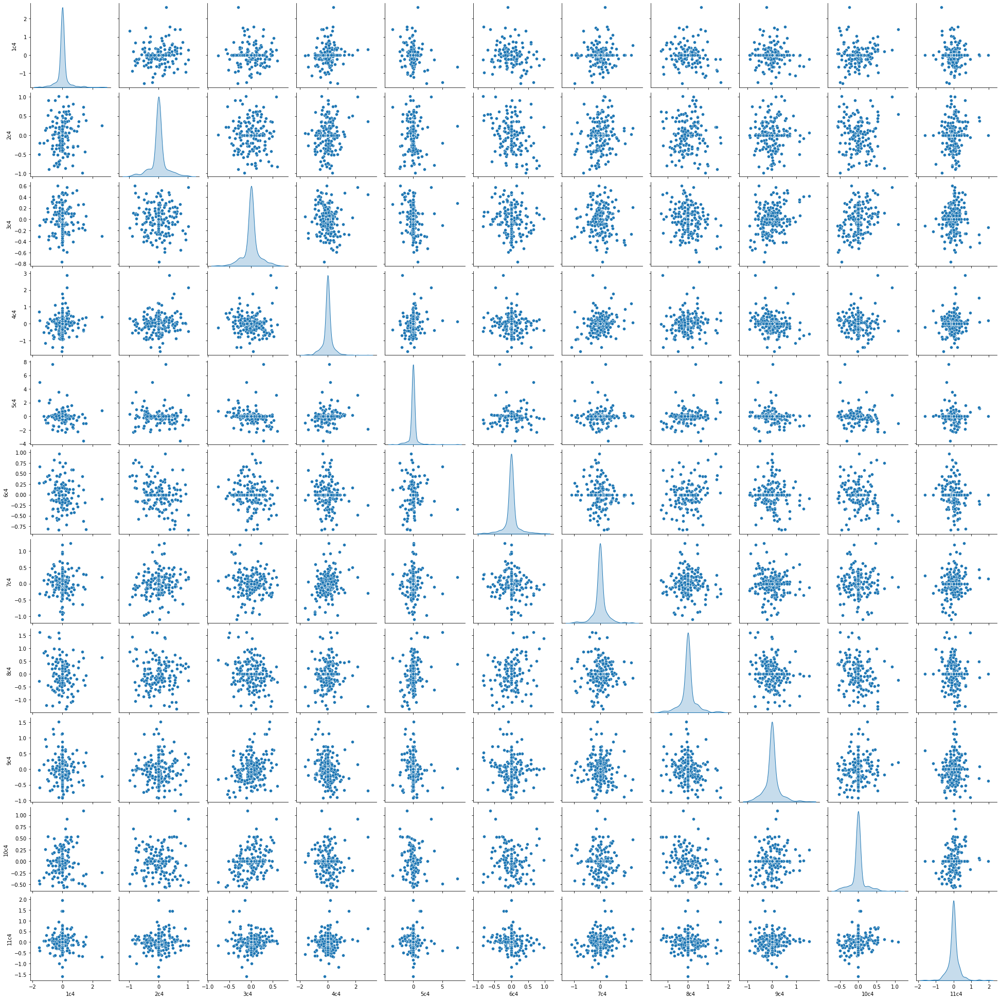

<Figure size 1152x1152 with 0 Axes>

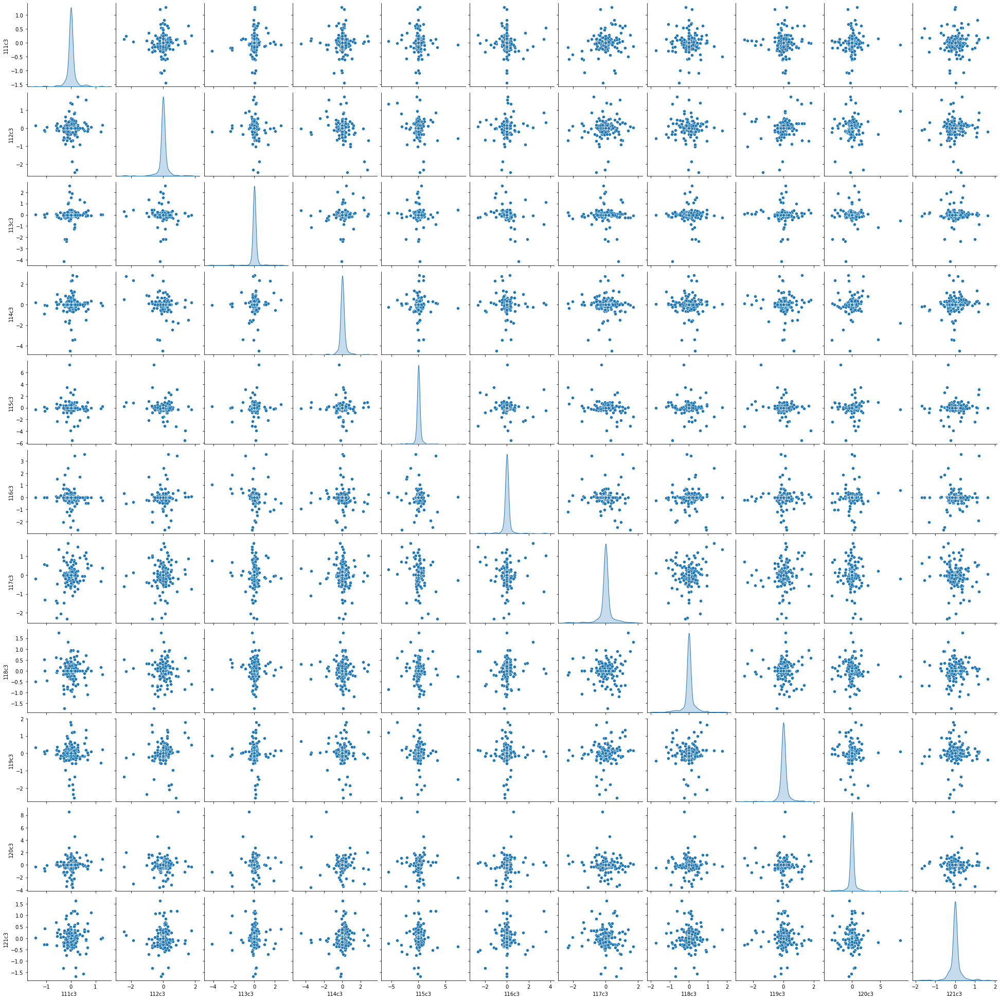

<Figure size 1152x1152 with 0 Axes>

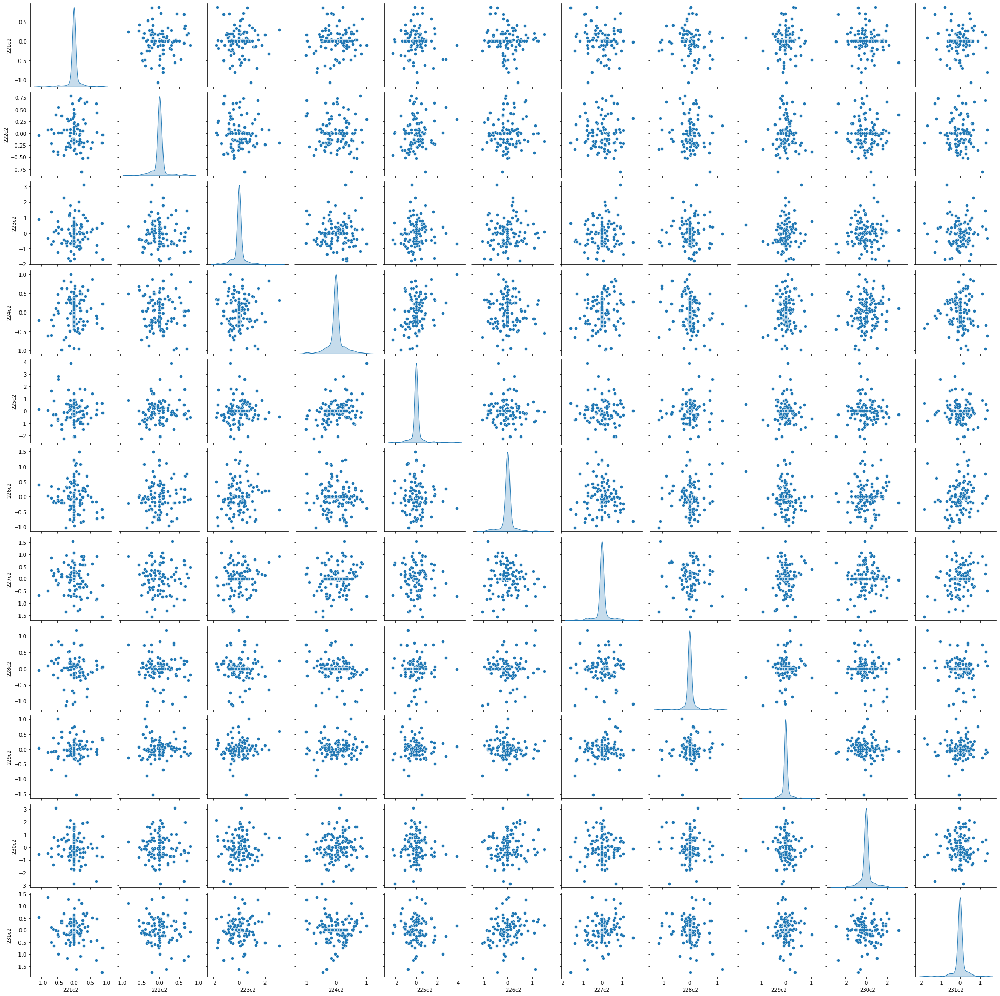

<Figure size 1152x1152 with 0 Axes>

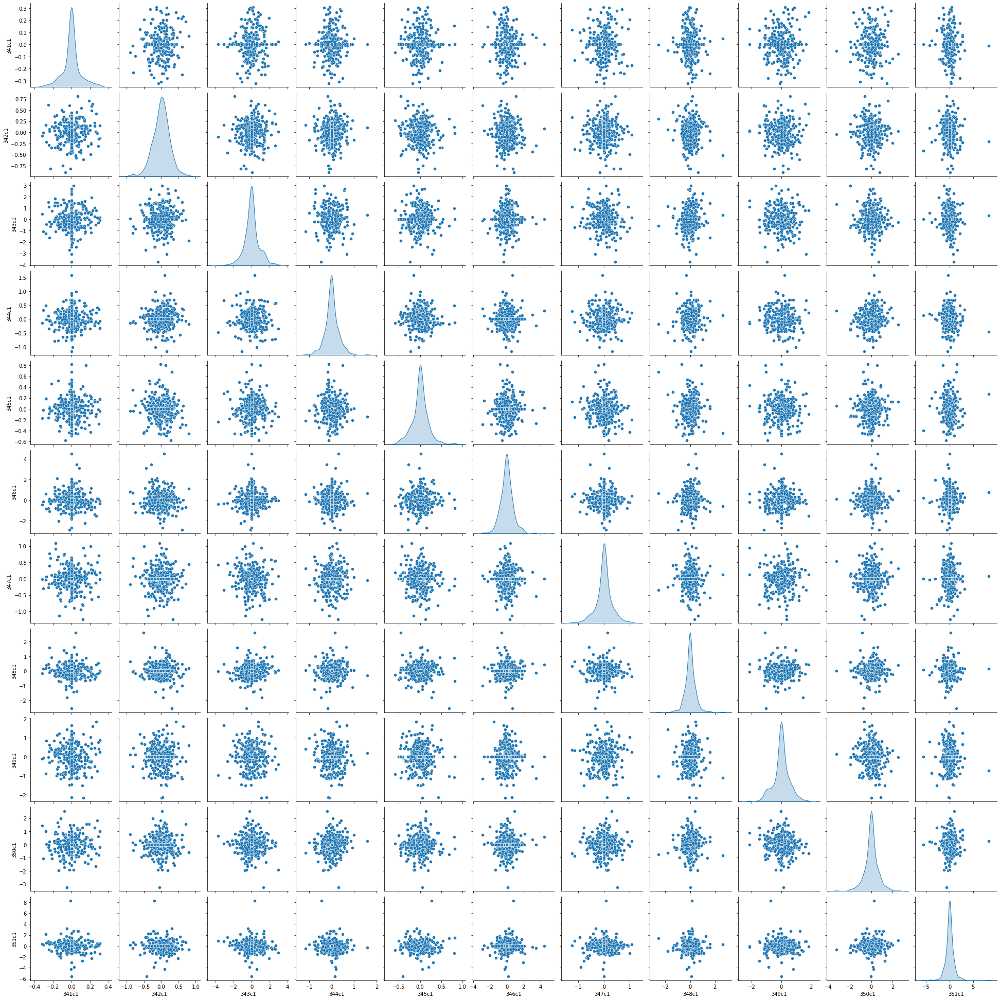

<Figure size 1152x1152 with 0 Axes>

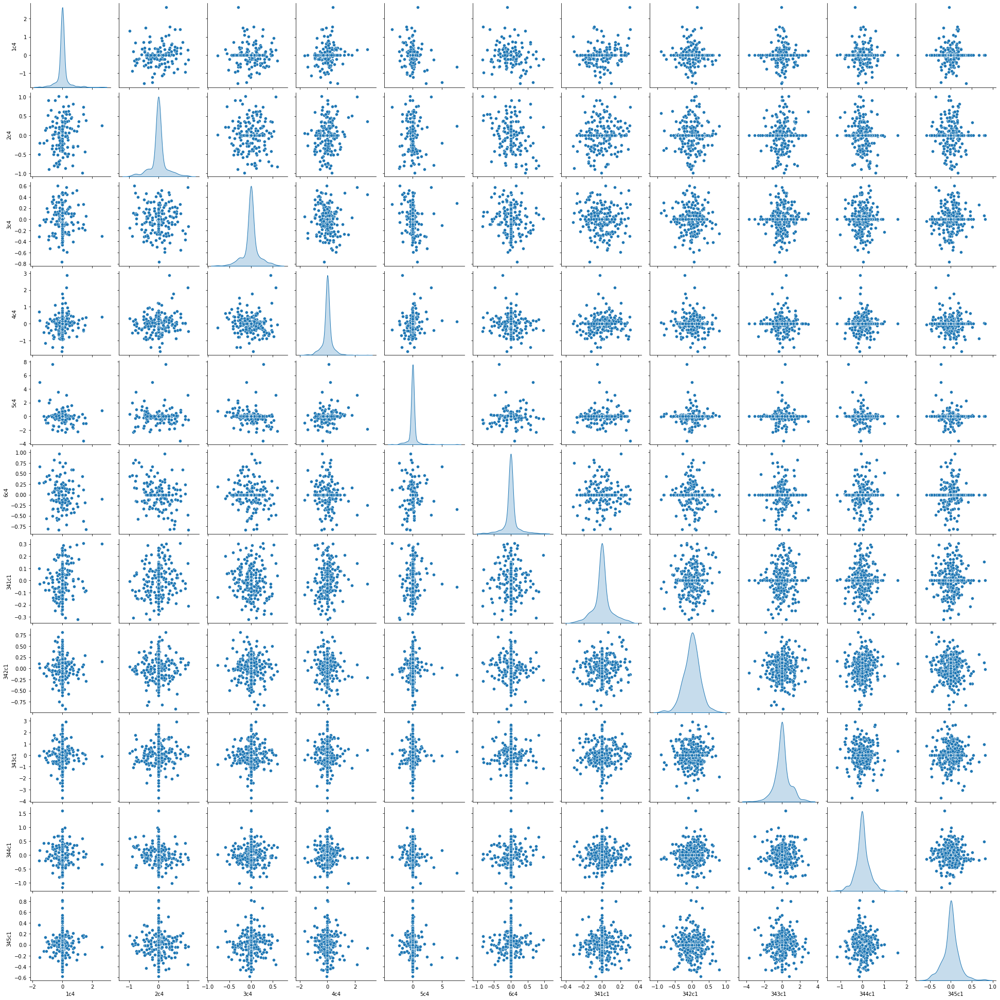

<Figure size 1152x1152 with 0 Axes>

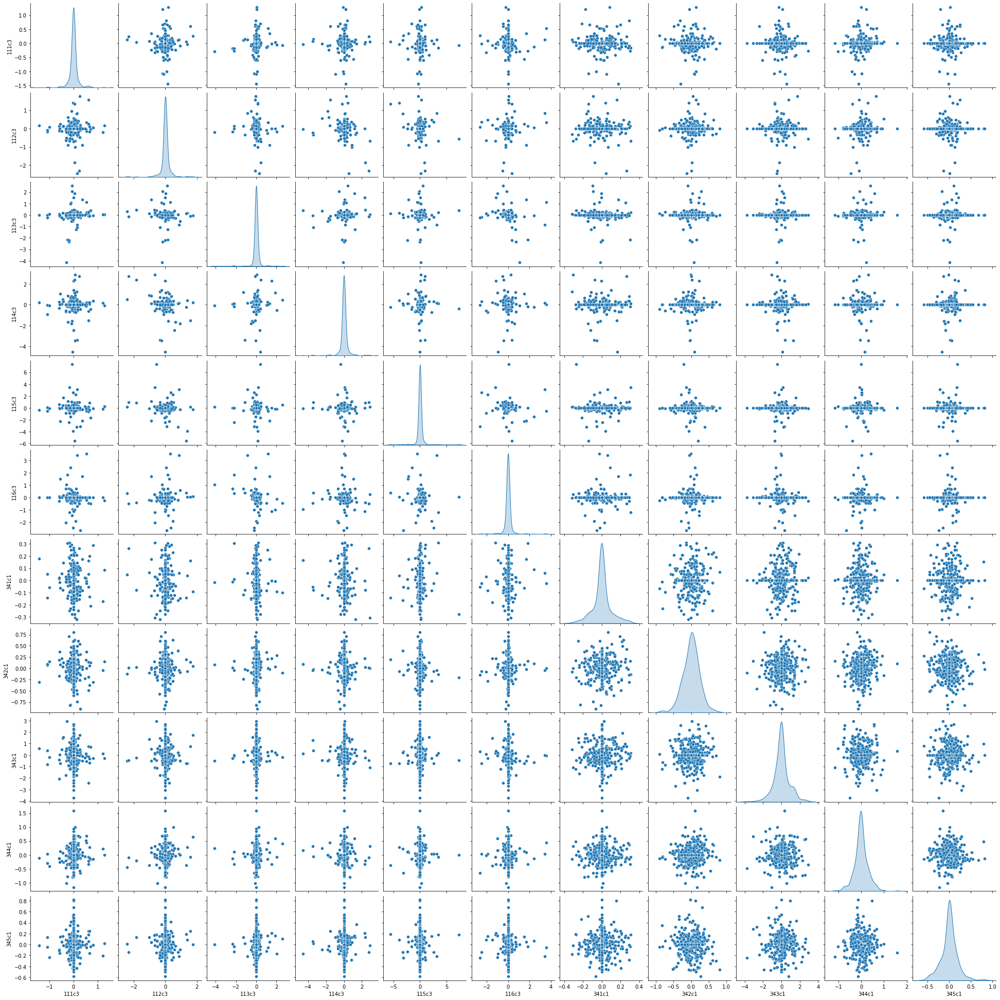

<Figure size 1152x1152 with 0 Axes>

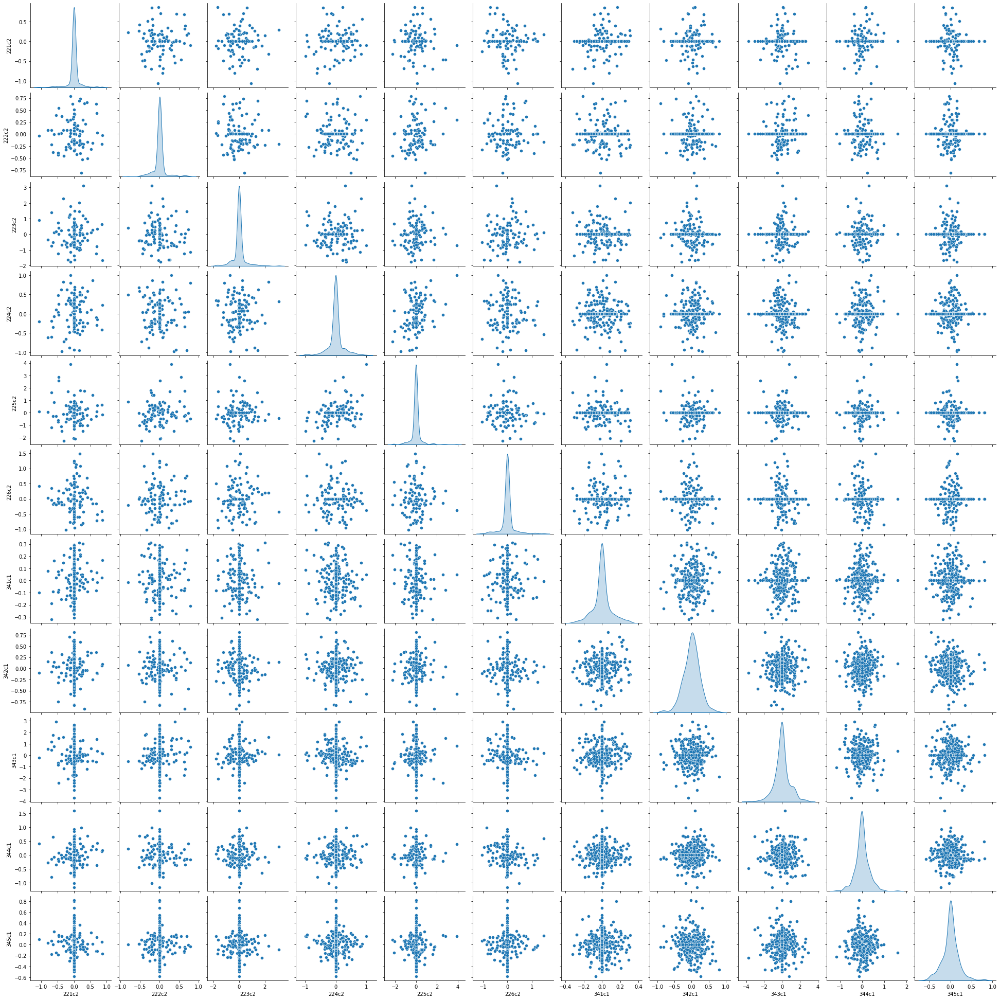

In [4]:
input_filled_df = input_df.fillna(input_df.mean())

fig1 = plt.figure(figsize=(16,16));
sns.pairplot(input_filled_df.iloc[:,np.hstack((range(0,11)))],diag_kind = 'kde', palette='Set1');
fig2 = plt.figure(figsize=(16,16));
sns.pairplot(input_filled_df.iloc[:,np.hstack((range(110,121)))],diag_kind='kde',palette='Set1');
fig3 = plt.figure(figsize=(16,16));
sns.pairplot(input_filled_df.iloc[:,np.hstack((range(220,231)))],diag_kind='kde',palette='Set1');
fig4 = plt.figure(figsize=(16,16));
sns.pairplot(input_filled_df.iloc[:,np.hstack((range(340,351)))],diag_kind='kde',palette='Set1');
fig5 = plt.figure(figsize=(16,16));
sns.pairplot(input_filled_df.iloc[:,np.hstack((range(0,6), range(340,345)))],diag_kind='kde',palette='Set1');
fig6 = plt.figure(figsize=(16,16));
sns.pairplot(input_filled_df.iloc[:,np.hstack((range(110,116), range(340,345)))],diag_kind='kde',palette='Set1');
fig7 = plt.figure(figsize=(16,16));
sns.pairplot(input_filled_df.iloc[:,np.hstack((range(220,226), range(340,345)))],diag_kind='kde',palette='Set1');